# Advance Lane Finding Project

One of the important task to be performed by all human driver in identifying the lanes is to ensure their Car is within the lane when driving and as in to make sure they do not collide with any car. And if you take the example of Self- Driving Car it is really critical one. One of the important thing for self driving car is the perception , and computer vision is the major part of perception. Here, we want to find the lane marking on the roads using Computer Vision. For drawing lane lines the roades, lane curvature, and estimate the vechile position to the lane, we have to do following steps :

1. Camera calibration matrix computation and distortion coefficients from a set of chessboard images
2. Image Undistortion
3. Color & gradient threshold to focus on lane lines
4. Perspective Transform for production of a bird's eye view image
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

Our Pipeline pipeline depends on these preliminary tasks.

1. Camera Calibration
2. Perspective Measurement

Then, the pipeline applies these stages.

1. Distortion Correction
2. Gradient and Color Thresholds
3. Perspective Transform
4. Lane-line Detection

# STEP-1 Calibration And Undistortion of the image

### Camera Calibration

We are going to start with finding the calibration matrix and distortion coefficient for the camera that was used to take picture of the road. This step is the important to fix the distortions in the real image caused after entering the pinhole. Therefore lines which is straight in the real world may not be anymore on our photos.

For computing the camera the transformation matrix and distortion coefficients, we use take multiple images of a chessboard which is clicked on a flat surface taken by the same camera. OpenCV has a convenient method called findChessboardCorners that will identify the points where black and white squares intersect and reverse engineer the distorsion matrix this way. 

The OpenCV functions findChessboardCorners and calibrateCamera are the backbone of the image calibration. A number of images of a chessboard, taken from different angles with the same camera, comprise the input. Arrays of object points, corresponding to the location (essentially indices) of internal corners of a chessboard, and image points, the pixel locations of the internal chessboard corners determined by findChessboardCorners, are fed to calibrateCamera which returns camera calibration and distortion coefficients. These can then be used by the OpenCV undistort function to undo the effects of distortion on any image produced by the same camera. Generally, these coefficients will not change for a given camera (and lens).

In [1]:
#Importing important libraries

import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

***In this case we have nx =9 and ny =6 respectively, Number of inside corners in a row (nx) and column (ny). So we have to do calibration using nx =9 and ny =6***

In [2]:
#Number of inside corners in a row (nx) and column (ny) 
nx = 9
ny = 6

# Reading all the caliberation images from the camera_cal folder
images = glob.glob("camera_cal/calibration*.jpg")

# Preparation of object points 
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Storing object points and image points in array from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

#  Search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Finding of the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, adding object points, image points in the array which we are going to use later
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

Text(0.5,1,'Undistorted Image')

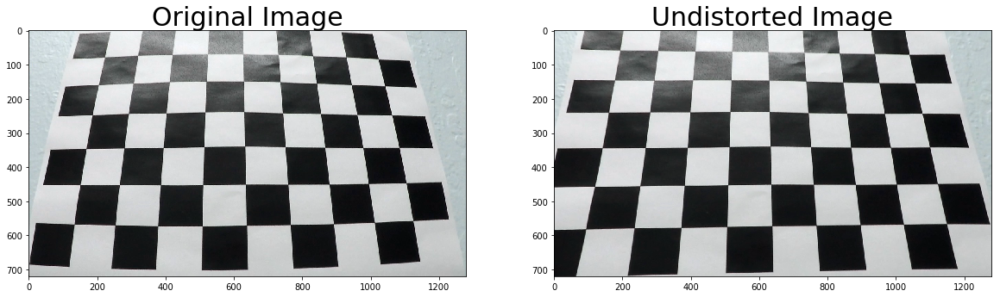

In [3]:
# Testing of undistortion on an image
img = cv2.imread('camera_cal/calibration3.jpg')
img_size = (img.shape[1], img.shape[0])

# Calibrating given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/undistorted.jpg', dst)

# Saving the camera calibration result for later use
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )

# Visualizing undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

We can see above that corners are very well identified.We have run our chessboard finding algorithm over multiple chessboard images taken from different angles to identify image and object points to calibrate the camera. The former refers to coordinates in our 2D mapping while the latter represents the real-world coordinates of those image points in 3D space (with z axis, or depth = 0 for our chessboard images). Now we are creating the pickle matrix using that we will do camera calibration with the given object points and image points

### Image Undistortion : 

Now we are in the position to get the images undistort, by applying below function a distortion correction can be done.

The get_undistort function takes a sequence of calibration checkerboard image filenames, applies the image. The new function function uses the **OpenCV undistort function** to remove distortion from images taken with the same camera.

In [4]:
# Function is used to return undistorted images
def undistort(image):
    return cv2.undistort(image, mtx, dist, None, mtx)

We can see the undistorted test image below. The effect is subtle and difficult to notice, but close inspection shows that at least a small amount of radial distortion is removed by this process.

Text(0.5,1,'Undistorted Image')

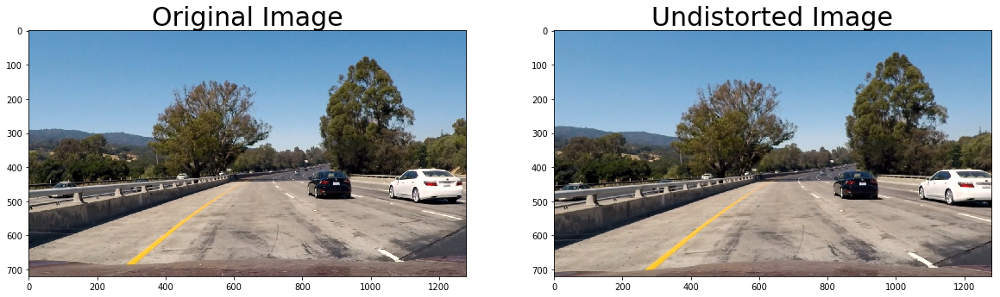

In [5]:
# Undistorting all images from Test folder
img =  mpimg.imread('test_images/test1.jpg')
undist = undistort(img)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)

# STEP-2 Thresholding of the Images

In this section to better detect the lines, we will apply color and edge thresholding , it makes easier to find the polynomial that best describes our left and right lanes later. We are going to Combine Thresholding (SobelX, R and S Channel)

In [6]:
def combined_threshold(image,Rthresh = (200, 255),Sthresh = (90, 255),thresh=(20, 100)):
    

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
           
    R = image[:,:,0]    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    
    #Combining the  Threshold - SobelX, Red Channel, Saturation
    binary = np.zeros_like(scaled_sobel)
    binary[((scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])) | (((R > Rthresh[0]) & (R <= Rthresh[1])) & ((S > Sthresh[0]) & (S <= Sthresh[1])))] = 1
    #binary[((scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])) | ((S > Sthresh[0]) & (S <= Sthresh[1]))] = 1
    return binary

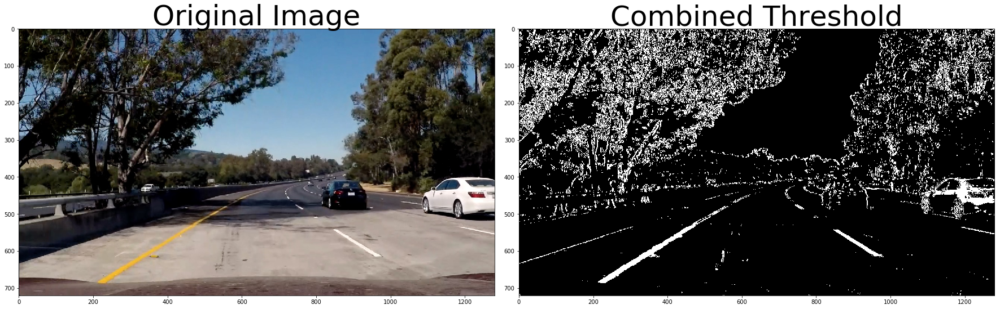

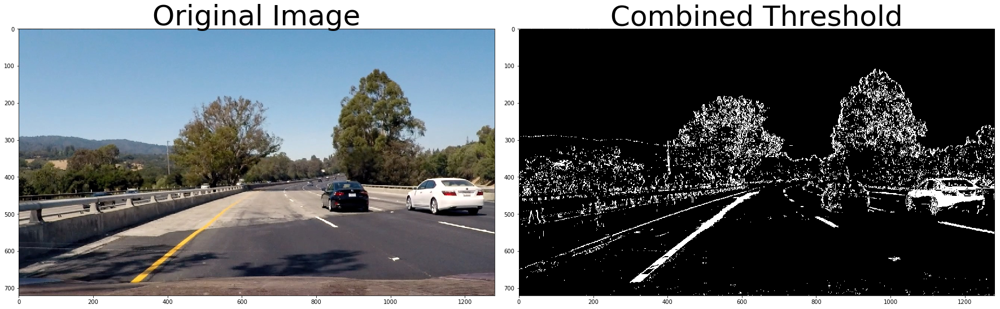

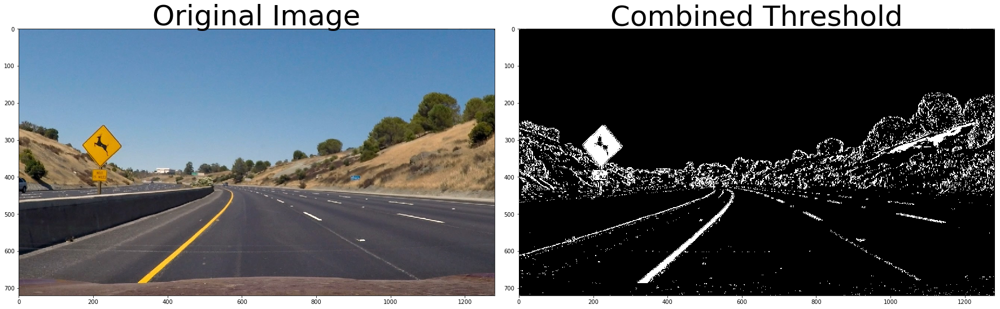

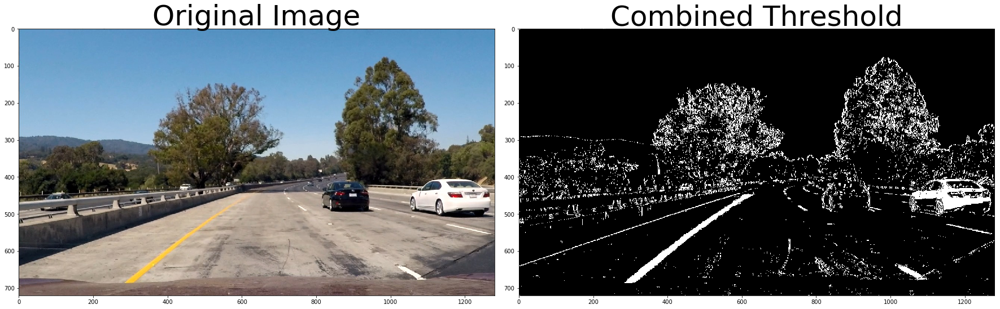

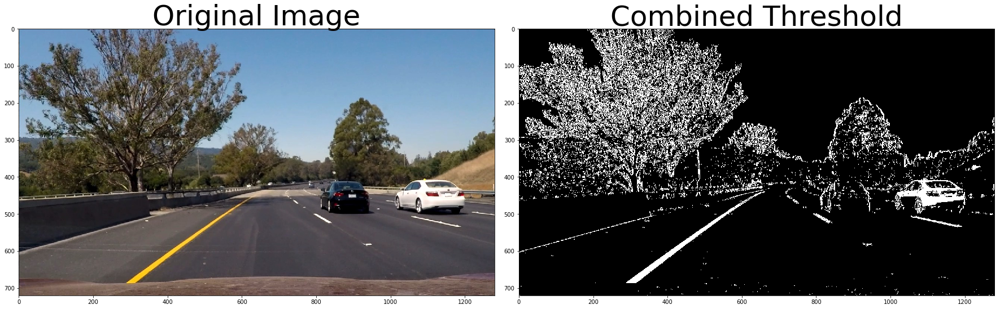

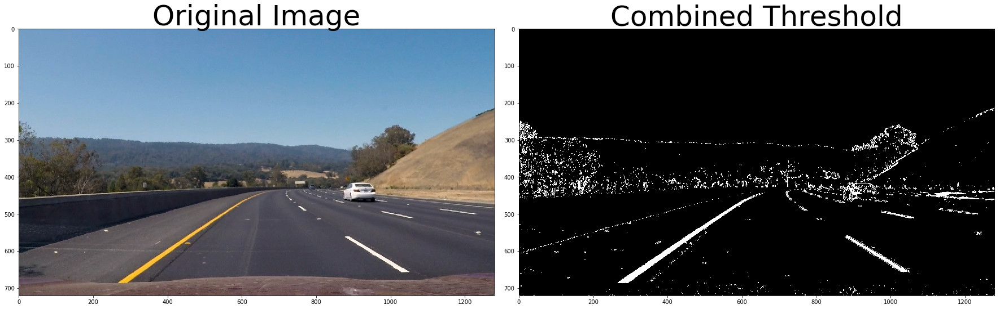

In [7]:
# Applying thresholding and plotting the images

images = glob.glob("test_images/test*.jpg")

for idx, fname in enumerate(images):
    image = mpimg.imread(fname)

    binary = combined_threshold(image,Rthresh = (200, 255),Sthresh = (90, 255),thresh=(20, 100))

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(binary, cmap='gray')
    ax2.set_title('Combined Threshold', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# STEP-3: Perspective Transform for production of a bird's eye view image

We now need to define a trapezoidal region in the 2D image that will go through a perspective transform to convert into a bird's eye view.  

For perspective transform we are going to use 2 important OpenCV functions **cv2.getPerspectiveTransform** and **cv2.warpPerspective**. 

In [8]:
# Creating perspective transform of the images from the camera, calculating Source(scr) and destination(dst)
def warp(binary):
    
    src = np.float32([[(binary.shape[1]/2) - 45, binary.shape[0]*0.65], [(binary.shape[1]/2) + 100, binary.shape[0]*0.65], [(binary.shape[1]/2) + 420, binary.shape[0]-50], [(binary.shape[1]/2) - 340, binary.shape[0]-50]])
    dst = np.float32([[(binary.shape[1]/2) - (binary.shape[0]/2), 0], [(binary.shape[1]/2) + (binary.shape[0]/2), 0], [(binary.shape[1]/2) + (binary.shape[0]/2), binary.shape[0]], [(binary.shape[1]/2) - (binary.shape[0]/2), binary.shape[0]]])
          
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(binary, M, (binary.shape[1], binary.shape[0]), flags=cv2.INTER_LINEAR)
        
    return warped,src,dst

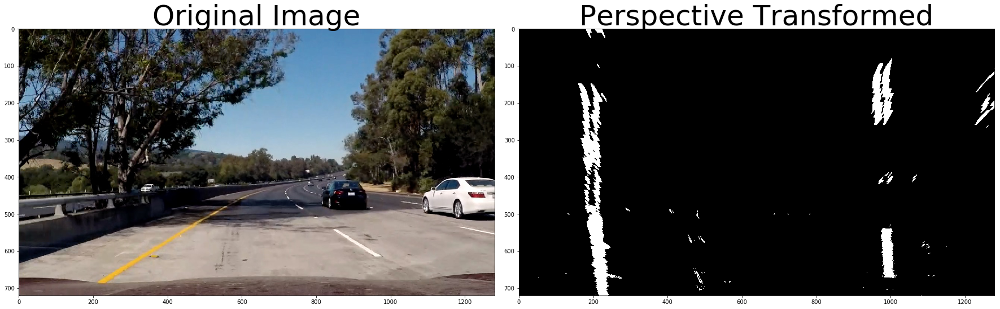

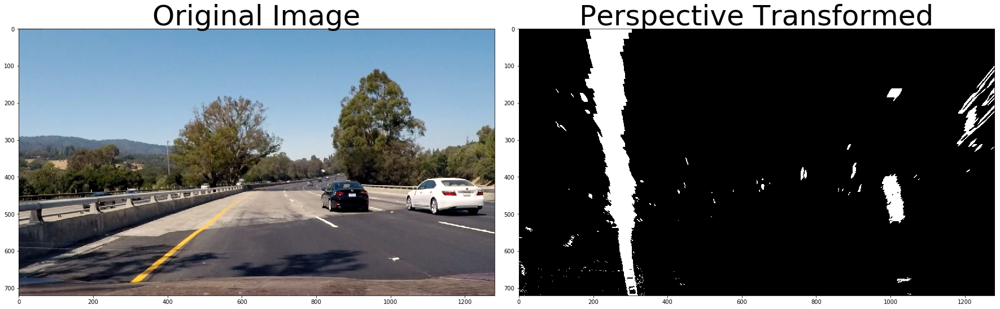

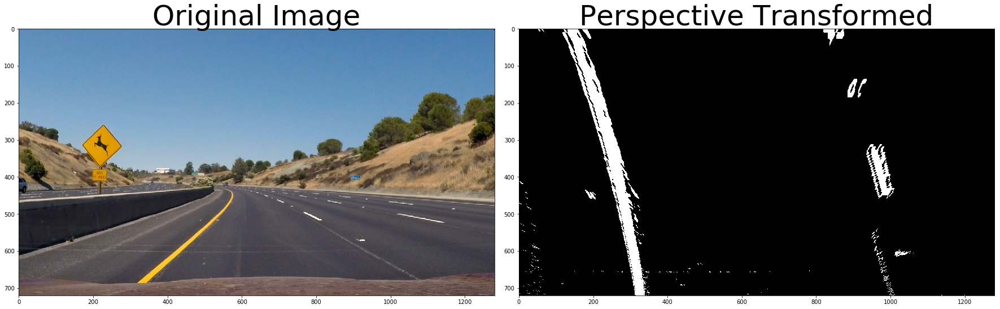

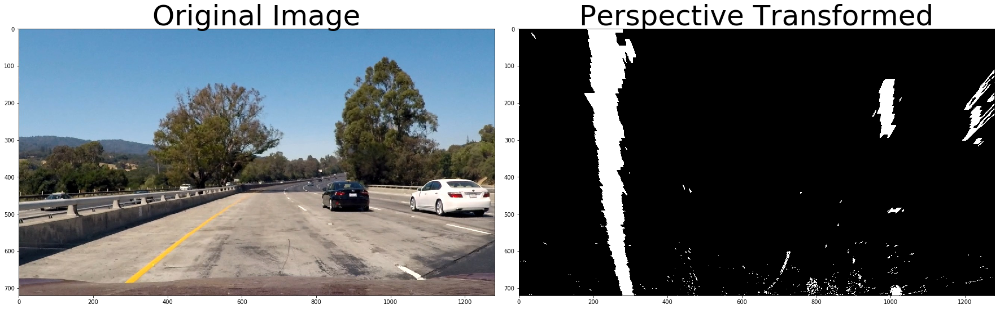

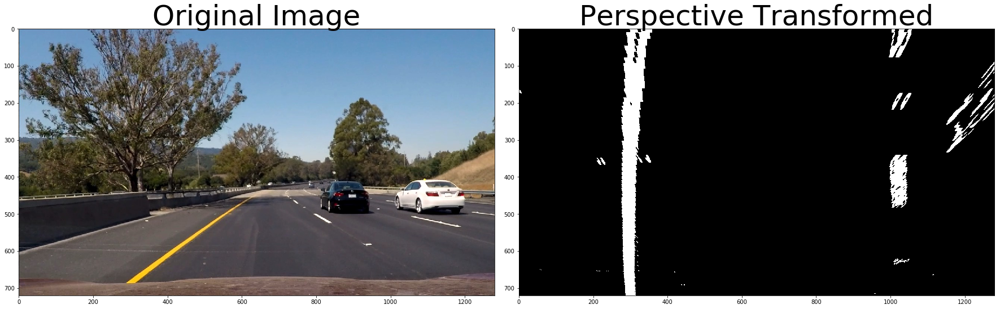

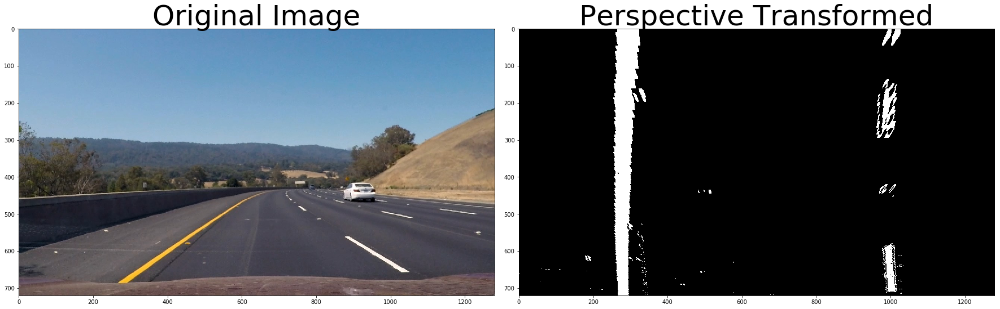

In [9]:
#Testing on all the images

images = glob.glob("test_images/test*.jpg")

for idx, fname in enumerate(images):
    image = mpimg.imread(fname)
    
    warped_img,src,dst = warp(combined_threshold(image))
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(warped_img, cmap='gray')
    ax2.set_title('Perspective Transformed', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

We can see below the "birds-eye" (i.e. top-down) view of the road 

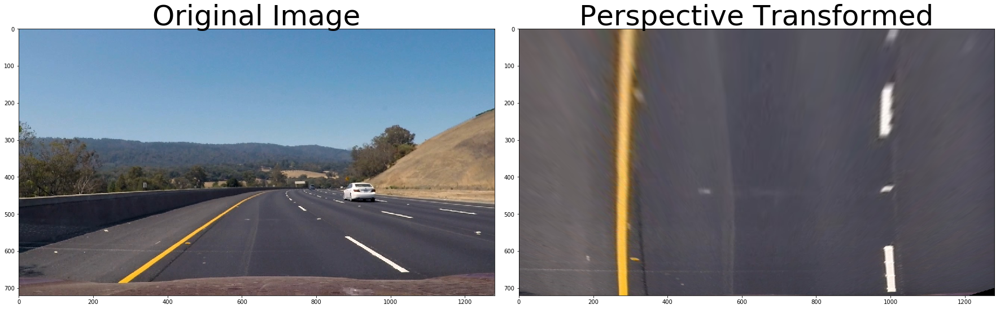

In [10]:
# Perspective transform visualization 

warped_img,src,dst = warp(image)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped_img, cmap='gray')
ax2.set_title('Perspective Transformed', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


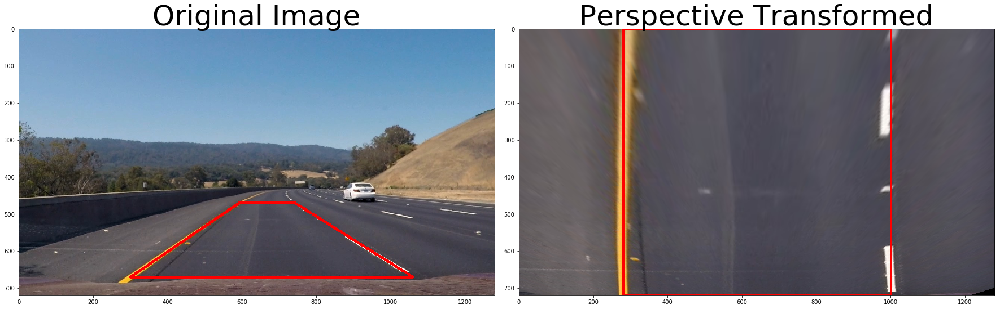

In [11]:
# Let's test perspective transform is done correctly

temp= mpimg.imread(images[5])

warped_img,src,dst = warp(temp)

pts = np.array(src, np.int32)
pts = pts.reshape((-1,1,2))
temp = cv2.polylines(temp,[pts],True,(255,0,0),thickness=5)

pts = np.array(dst, np.int32)
pts = pts.reshape((-1,1,2))
warped_img = cv2.polylines(warped_img,[pts],True,(255,0,0),thickness=5)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(temp)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped_img, cmap='gray')
ax2.set_title('Perspective Transformed', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [12]:
# Hardcoded Source and Destination points to perform perspective transform
print('Source Points\n',src,'\n')
print('Destination Points\n',dst)

Source Points
 [[  595.   468.]
 [  740.   468.]
 [ 1060.   670.]
 [  300.   670.]] 

Destination Points
 [[  280.     0.]
 [ 1000.     0.]
 [ 1000.   720.]
 [  280.   720.]]


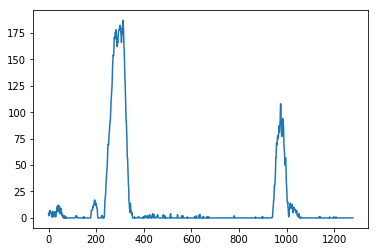

In [13]:
#Histogram of Pixel Intensities 

%matplotlib inline
image = mpimg.imread(images[2])
warped_img,src,dst = warp(combined_threshold(image))
histogram = np.sum(warped_img[int(warped_img.shape[0]/2):,:], axis=0)
plt.plot(histogram)

#plt.imshow(image)

# STEP 4: Apply Sliding window for finding hot lane line pixels

In [14]:
def find_lane_lines(binary_warped,left_fit=None, right_fit=None):
    
    
    if (left_fit is None) & (right_fit is None):
        
        # Assuming you have created a warped binary image called "binary_warped" & Take a histogram of the bottom half of the image
        
        histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
        
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        
        # Finding the peak of the left and right halves of the histogram & These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choosing the number of sliding windows as 9
        nwindows = 9
        
        # Setting height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        
        # Setting the width of the windows +/- margin
        margin = 100
        
        # Setting minimum number of pixels found to recenter window
        minpix = 50
        
        # Creating empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Stepping through the windows one by one
        for window in range(nwindows):
            
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            
            # Drawing the windows on the visualization image &Identifying the nonzero pixels in x and y within the window
            
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            
            # Appending these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
                                 
        # Concatenating the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

    # If we have already found lane points, using points from previous frame
    else:
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
       
    # Extracting left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
     
    return ploty,left_fitx,right_fitx,left_fit,right_fit


***The following figures shows the annotated image resulting from applying this particular lane-finding algorithm to our test images, after distortion correction, highlighting, and perspective transformation.***

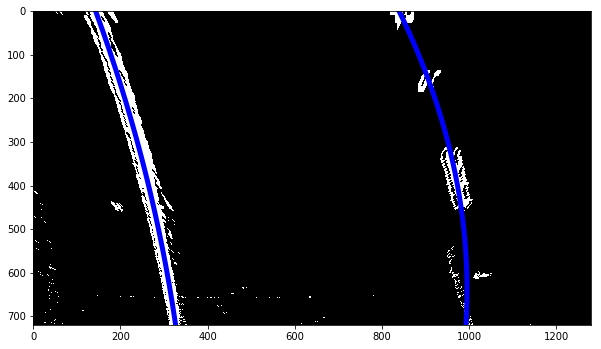

In [15]:
# Visualizion of the lane lines
ploty,left_fitx,right_fitx,left_fit,right_fit = find_lane_lines(warped_img)

plt.figure(figsize=(10,10))
plt.imshow(warped_img,cmap='gray')
plt.plot(left_fitx, ploty, color='blue',linewidth=5.0)
plt.plot(right_fitx, ploty, color='blue', linewidth=5.0)

# STEP-5: Find Lane Curvature and Vehicle Position


In [16]:
def curvature(ploty, left_fitx, right_fitx):
    y_eval = np.max(ploty)

    # Defining conversions in x and y from pixels space to meters
    ym_per_pix = 20/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fitting new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    # Calculating the new radius of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    curvature = ((left_curverad+right_curverad)/2)
    
    vehicle_position = (((left_fitx[719] + right_fitx[719]) / 2) - 640) * xm_per_pix
    
    return (curvature,vehicle_position)

In [17]:
def highlight_lane (image,warped_img,src,dst,curv,pos,ploty,left_fitx,right_fitx):
    
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recasting the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Drawing the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warpping the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    
    # Combining the result 
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    result = cv2.putText(result, "Lane Curvature: {0:.2f}m".format(curv), (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, [255, 255, 0], 2)
    result = cv2.putText(result, "Vehicle Position: {0:.2f}m".format(pos), (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, [255, 255, 0], 2)
    
    return(result)

In the function above how we annotate the image with an estimate of the position of the car with respect to the center of the road. It is a simple average of the pixel coordinates of the two lanes at the bottom of the image, minus the pixel coordinate of the image center, then scaled to a real-world value (meters).

Lane curvature: 335.482801521 m
Vehicle Position: 0.10305580696 m


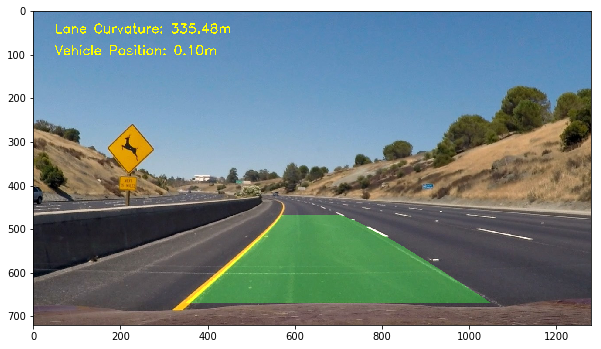

In [18]:
# Final output Visualization

curv,pos = curvature(ploty, left_fitx, right_fitx)
print('Lane curvature:',curv,'m')
print('Vehicle Position:',pos,'m')

final = highlight_lane (image,warped_img,src,dst,curv,pos,ploty,left_fitx,right_fitx)
plt.figure(figsize=(10,10))
plt.imshow(final)

In [19]:
# Pipeline function that includes all above functions

left_fit = None
right_fit = None

def pipeline(input_image):
    
    global left_fit
    global right_fit
       
    undistorted = undistort(input_image)
    binary_warped,src,dst = warp(combined_threshold(undistorted))
    
    if (left_fit is not None) & (right_fit is not None):
        ploty, left_fitx, right_fitx, left_fit, right_fit = find_lane_lines(binary_warped, left_fit, right_fit)
    else:
        ploty, left_fitx, right_fitx, left_fit, right_fit = find_lane_lines(binary_warped)
    
    curv,pos = curvature(ploty, left_fitx, right_fitx)
    final = highlight_lane (input_image,binary_warped,src,dst,curv,pos,ploty,left_fitx,right_fitx)
    
    return final

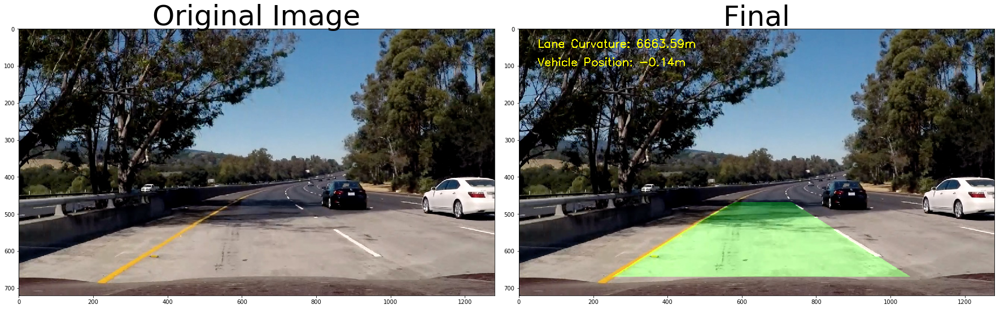

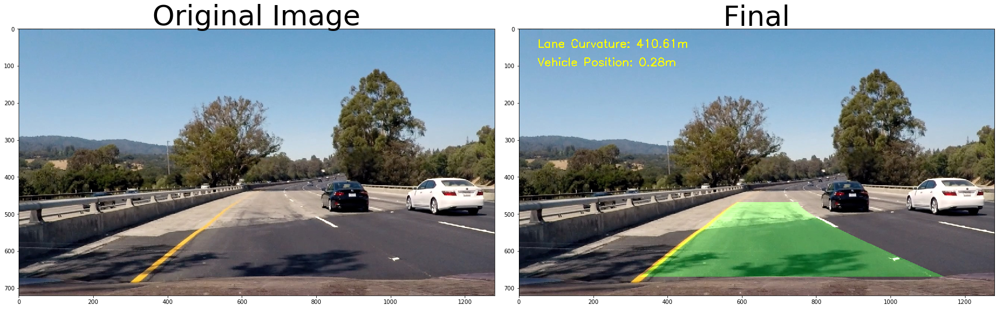

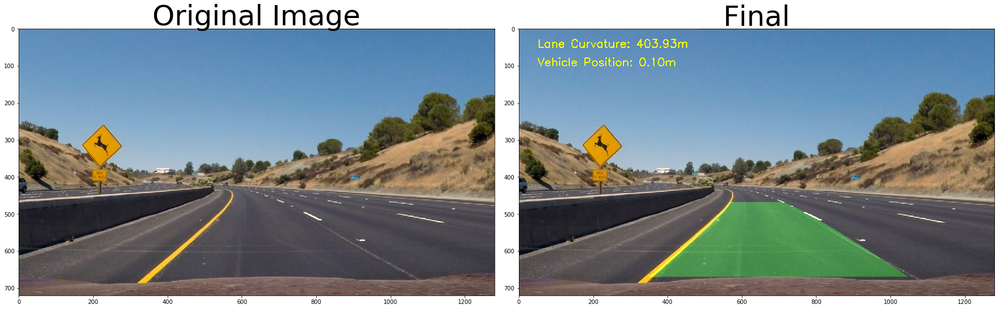

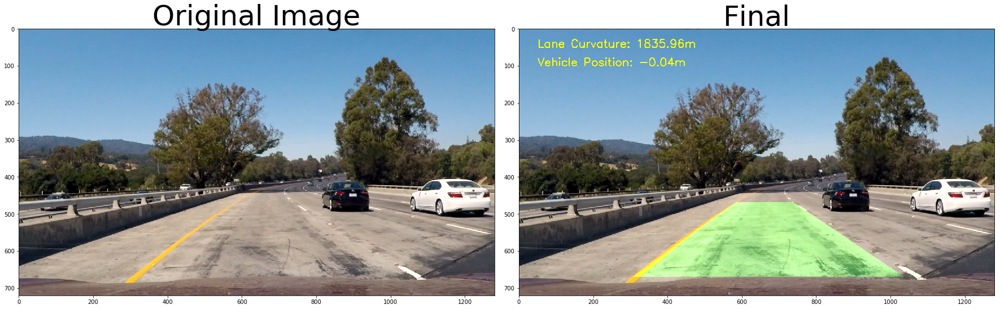

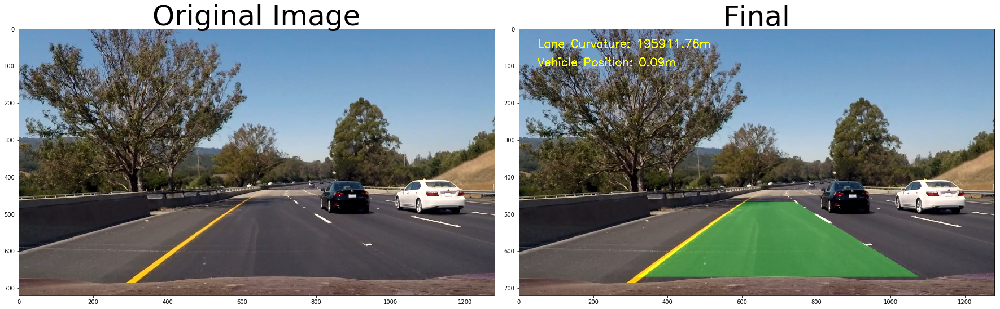

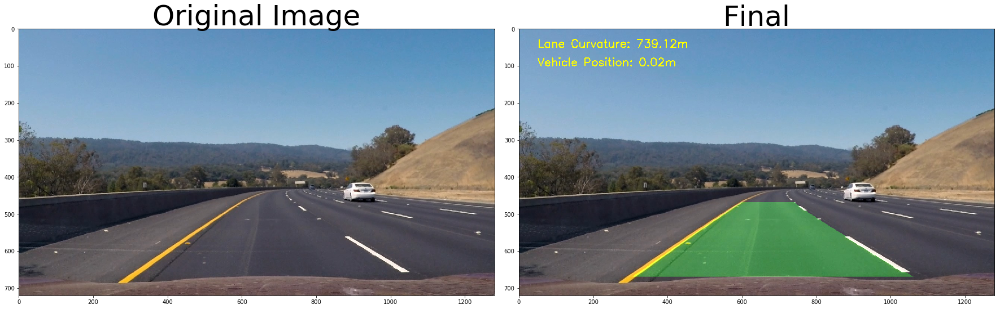

In [20]:
#Testing on all test images first
images = glob.glob("test_images/test*.jpg")

for idx, fname in enumerate(images):
    image = mpimg.imread(fname)

    final = pipeline(image)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    
    ax2.imshow(final)
    ax2.set_title('Final', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

***It is working fine on the images so time to test it on video output***

In [21]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output_file = "project_video_output.mp4"
project_video = VideoFileClip("project_video.mp4")

project_output = project_video.fl_image(pipeline)
%time project_output.write_videofile(project_output_file, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [05:11<00:00,  4.22it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 2min 45s, sys: 14.2 s, total: 2min 59s
Wall time: 5min 14s


In [22]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output_file))